In [1]:
import numpy as np
import matplotlib.pyplot as plt
import keras
import pandas as pd
from keras import datasets
from sklearn.model_selection import train_test_split
import sklearn.linear_model as sklm
from sklearn.metrics import roc_curve, auc
import sklearn.metrics

seed = 42
keras.utils.set_random_seed(seed)

def logistic_regression(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed)
    reglog = sklm.LogisticRegression(class_weight='balanced')
    reglog.fit(X_train, y_train)
    y_pred = reglog.predict(X_test)

    correct_correct = np.sum((y_test == 1) & (y_pred == 1))
    correct_incorrect = np.sum((y_test == 1) & (y_pred == 0))
    incorrect_correct = np.sum((y_test == 0) & (y_pred == 1))
    incorrect_incorrect = np.sum((y_test == 0) & (y_pred == 0))

    confusion_matrix = np.array([[correct_correct, correct_incorrect], [incorrect_correct, incorrect_incorrect]])
    plot = plt.imshow(confusion_matrix, cmap='Blues')
    for i in range(2):
        for j in range(2):
            plt.text(j, i, confusion_matrix[i, j], ha='center', va='center')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.xticks([0, 1], ['Correct', 'Incorrect'])
    plt.yticks([0, 1], ['Correct', 'Incorrect'])
    plt.title('Confusion matrix')

    # Roc-Auc
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    print('AUROC: ', round(roc_auc*100, 2))

    # # FPR at 95% TPR
    # fpr95 = fpr[np.argmax(tpr >= 0.95)]

    # # TNR at 95% TPR
    # tnr95 = 1 - fpr95
    # print('TNR at 95% TPR:', round(tnr95*100, 2))

    # # Detection accuracy
    # detection_accuracy = (correct_correct + incorrect_incorrect) / len(y_test)
    # print('Detection accuracy: ', round(detection_accuracy*100, 2))

    # AUPR when the prediction is "correct"
    aupr_success = sklearn.metrics.average_precision_score(y_test, y_pred)
    print('AUPR success: ', round(aupr_success*100, 2))

    # AUPR when the prediction is "inccorect"
    aupr_failure = sklearn.metrics.average_precision_score(1-y_test, 1-y_pred)
    print('AUPR failure: ', round(aupr_failure*100, 2))

    return plot

2025-03-01 11:13:58.736305: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-01 11:13:59.046271: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# MNIST

In [2]:
(X_train, y_train), (X_test, y_test) = datasets.mnist.load_data()
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)

model = keras.models.load_model('models/mnist_cnn.keras')

score = model.evaluate(X_test, y_test, verbose=0)
print('Test accuracy:', round(score[1], 4)*100)
print('Test error:', round((1-score[1])*100, 4))

Test accuracy: 98.39
Test error: 1.61


In [3]:
df = pd.read_csv('case_database_mnist.csv')
df = df.sort_values(by=['element', 'layer'])
df['decision_change'] = df.groupby('element')['decision'].diff().fillna(0).astype(bool).astype(int)
df = df[['element', 'real', 'final_prediction', 'layer', 'uncertainty', 'decision', 'decision_change']]
last_element = int(df['element'].max()) if not df.empty else 0

print(df.to_markdown(index=False))

|   element |   real |   final_prediction |   layer |   uncertainty |   decision |   decision_change |
|----------:|-------:|-------------------:|--------:|--------------:|-----------:|------------------:|
|         0 |      7 |                  7 |       0 |     -0        |          7 |                 0 |
|         0 |      7 |                  7 |       1 |     -0        |          7 |                 0 |
|         0 |      7 |                  7 |       2 |     -0        |          7 |                 0 |
|         0 |      7 |                  7 |       3 |     -0        |          7 |                 0 |
|         0 |      7 |                  7 |       4 |     -0        |          7 |                 0 |
|         0 |      7 |                  7 |       5 |     -0        |          7 |                 0 |
|         1 |      2 |                  2 |       0 |     -0        |          2 |                 0 |
|         1 |      2 |                  2 |       1 |     -0        |    

AUROC:  90.03
AUPR success:  99.6
AUPR failure:  33.96
AUROC:  78.7
AUPR success:  99.14
AUPR failure:  20.0
AUROC:  92.5
AUPR success:  99.7
AUPR failure:  24.38


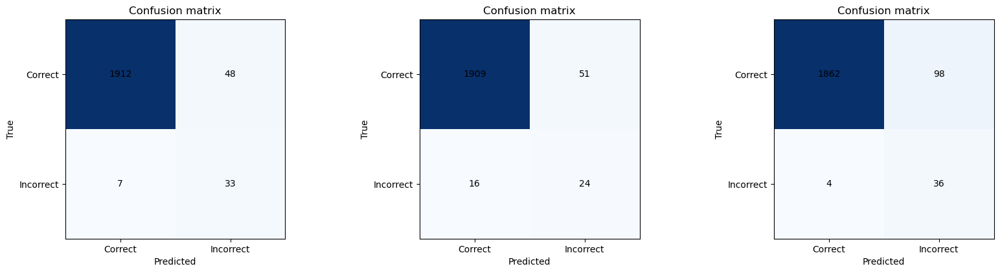

AUROC:  92.91
AUPR success:  99.71
AUPR failure:  27.66


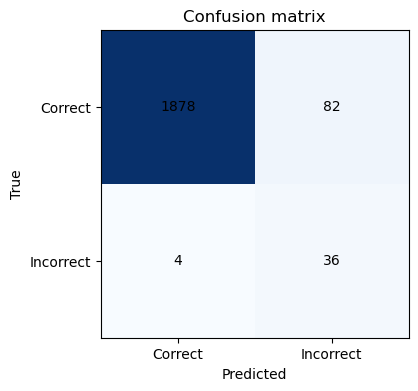

AUROC:  91.81
AUPR success:  99.67
AUPR failure:  27.84


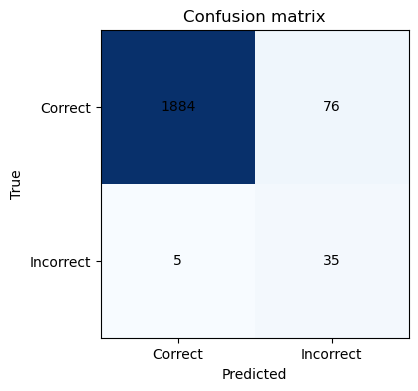

In [7]:
# Softmax baseline
probs = model.predict(X_test[:last_element+1], verbose=0)
softmax = np.max(probs, axis=1)

# Decision changes
dec_changes = df.groupby('element')['decision_change'].apply(list).apply(lambda x: x[1:])

# Layer uncertainty
uncertainty = df.groupby('element')['uncertainty'].apply(list)

y = df.groupby('element')['real'].sum() == df.groupby('element')['final_prediction'].sum()
y = y.astype(int)

plt.figure(figsize=(20, 15))

# Softmax
plt.subplot(3, 3, 1)
X = softmax.reshape(-1, 1)
logistic_regression(X, y)

# Decision changes
plt.subplot(3, 3, 2)
X = np.array(dec_changes.tolist())
logistic_regression(X, y)

# Layer uncertainty
plt.subplot(3, 3, 3)
X = np.array(uncertainty.tolist())
logistic_regression(X, y)

plt.show()

# Combinación de ambos
plt.figure(figsize=(4, 4))
X = np.concatenate((np.array(dec_changes.tolist()), np.array(uncertainty.tolist())), axis=1)
logistic_regression(X, y)

plt.show()

# Combinación de las tres
plt.figure(figsize=(4, 4))
X = np.concatenate((softmax.reshape(-1, 1), np.array(dec_changes.tolist()), np.array(uncertainty.tolist())), axis=1)
logistic_regression(X, y)

plt.show()

# CIFAR10

In [9]:
(X_train, y_train), (X_test, y_test) = datasets.cifar10.load_data()
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)

model = keras.models.load_model('models/cifar10_cnn.keras')

score = model.evaluate(X_test, y_test, verbose=0)
print('Test accuracy:', round(score[1], 4)*100)
print('Test error:', round((1-score[1])*100, 4))

Test accuracy: 60.8
Test error: 39.2


In [10]:
df = pd.read_csv('case_database_cifar.csv')
df = df.sort_values(by=['element', 'layer'])
df['decision_change'] = df.groupby('element')['decision'].diff().fillna(0).astype(bool).astype(int)
df = df[['element', 'real', 'final_prediction', 'layer', 'uncertainty', 'decision', 'decision_change']]
last_element = int(df['element'].max()) if not df.empty else 0

print(df.to_markdown(index=False))

|   element |   real |   final_prediction |   layer |   uncertainty |   decision |   decision_change |
|----------:|-------:|-------------------:|--------:|--------------:|-----------:|------------------:|
|         0 |      3 |                  3 |       0 |      1.60944  |          3 |                 0 |
|         0 |      3 |                  3 |       1 |      1.69574  |          5 |                 1 |
|         0 |      3 |                  3 |       2 |      1.22061  |          6 |                 1 |
|         0 |      3 |                  3 |       3 |      1.22061  |          6 |                 0 |
|         0 |      3 |                  3 |       4 |      0.639032 |          3 |                 1 |
|         0 |      3 |                  3 |       5 |      0.639032 |          3 |                 0 |
|         1 |      8 |                  1 |       0 |      1.0889   |          8 |                 0 |
|         1 |      8 |                  1 |       1 |      0.639032 |    

AUROC:  71.33
AUPR success:  73.77
AUPR failure:  55.5
AUROC:  73.56
AUPR success:  75.5
AUPR failure:  57.9
AUROC:  71.96
AUPR success:  74.28
AUPR failure:  56.1


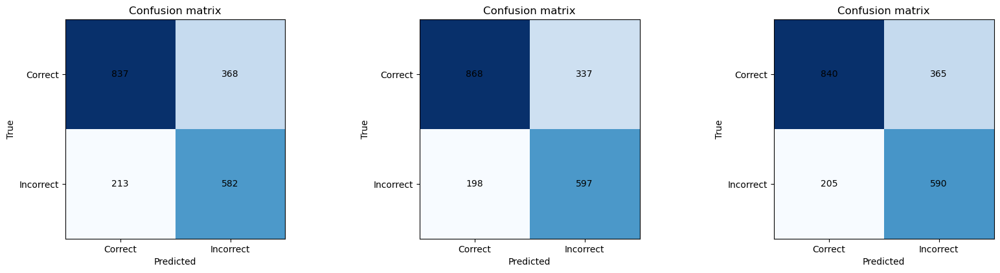

AUROC:  73.45
AUPR success:  75.51
AUPR failure:  57.58


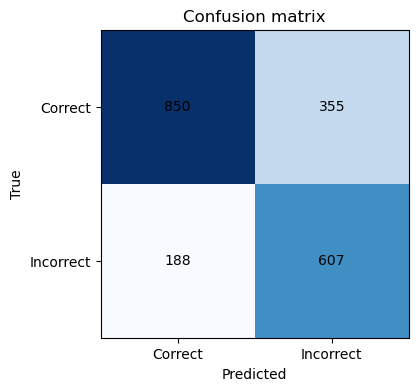

AUROC:  74.57
AUPR success:  76.4
AUPR failure:  58.85


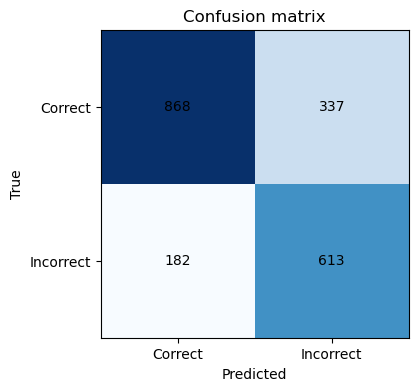

In [13]:
# Softmax baseline
probs = model.predict(X_test[:last_element+1], verbose=0)
softmax = np.max(probs, axis=1)

# Decision changes
dec_changes = df.groupby('element')['decision_change'].apply(list).apply(lambda x: x[1:])

# Layer uncertainty
uncertainty = df.groupby('element')['uncertainty'].apply(list)

y = df.groupby('element')['real'].sum() == df.groupby('element')['final_prediction'].sum()
y = y.astype(int)

plt.figure(figsize=(20, 15))

# Softmax
plt.subplot(3, 3, 1)
X = softmax.reshape(-1, 1)
logistic_regression(X, y)

# Decision changes
plt.subplot(3, 3, 2)
X = np.array(dec_changes.tolist())
logistic_regression(X, y)

# Layer uncertainty
plt.subplot(3, 3, 3)
X = np.array(uncertainty.tolist())
logistic_regression(X, y)

plt.show()

# Combinación de ambos
plt.figure(figsize=(4, 4))
X = np.concatenate((np.array(dec_changes.tolist()), np.array(uncertainty.tolist())), axis=1)
logistic_regression(X, y)

plt.show()

# Combinación de las tres
plt.figure(figsize=(4, 4))
X = np.concatenate((softmax.reshape(-1, 1), np.array(dec_changes.tolist()), np.array(uncertainty.tolist())), axis=1)
logistic_regression(X, y)

plt.show()